<a href="https://colab.research.google.com/github/JayRolla/market-sales-/blob/main/market%20sales%20prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install matplotlib

In [2]:
pip install ydata-profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.9/357.9 kB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 7.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.3/293.3 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 29.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 345.4/345.4 kB 23.3 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=6c0ed8e39f70ce8a9dbd537e8d7cb2619fd47f4bdc9d904f22505e9fabe1accf
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: pandas
    Found existing installation: pandas 1.5.3
    Uninstalling pand

In [46]:
import pandas as pd
import numpy as np
#import pandas profiling for quick summary of data
from ydata_profiling import ProfileReport
#libraries for visualizing the data
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
# Preprocessing
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.preprocessing import StandardScaler
# Model selection and evaluation
from sklearn.model_selection import  GridSearchCV
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
#Statistical analysis
from scipy.stats import ttest_ind
from scipy.stats import f_oneway
from scipy.stats import chi2_contingency

# Machine learning models
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
# Utility
import joblib
from joblib import dump, load

# Set up visualization settings for Jupyter Notebook (if using)
%matplotlib inline
sns.set_style("whitegrid")

In [4]:
train = pd.read_csv('https://raw.githubusercontent.com/JayRolla/market-sales-/main/train_market.csv')
test   = pd.read_csv('https://raw.githubusercontent.com/JayRolla/market-sales-/main/test_market.csv')

In [5]:
profile = ProfileReport(train, title='Pandas Profiling Report on training data', explorative=True)
profile.to_widgets()

/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:524: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/ydata_profiling/model/correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'could not convert string to float: 'Low Fat'')
  warnings.warn(


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
profile = ProfileReport(test, title='Pandas Profiling Report on test data', explorative=True)
profile.to_widgets()

/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:524: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/ydata_profiling/model/correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'could not convert string to float: 'Low Fat'')
  warnings.warn(


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

Item weight in both datasets contains missing values and there are a couple of NaN values in the outlet size


In [7]:
df1 = train.copy()
df2 = test.copy()

In [8]:
def impute_item_weight(df):
    """Impute missing Item_Weight based on the mean weight of the corresponding Item_Type."""
    return df.groupby('Item_Type')['Item_Weight'].transform(lambda x: x.fillna(x.mean()))

def impute_outlet_size(df):
    """Impute missing Outlet_Size based on the mode size of the corresponding Outlet_Type."""
    return df.groupby('Outlet_Type')['Outlet_Size'].transform(lambda x: x.fillna(x.mode()[0] if not x.mode().empty else np.nan))

'''
Now, i apply these functions to THE training and test datasets (df1 and df2),
Since I AM applying the same transformations to both datasets,
this approach ensures consistency in how missing values are handled across your datasets. '''


df1['Item_Weight'] = impute_item_weight(df1)
df1['Outlet_Size'] = impute_outlet_size(df1)

df2['Item_Weight'] = impute_item_weight(df2)
df2['Outlet_Size'] = impute_outlet_size(df2)

In [9]:
# Check if there are any NaN values left in the 'Item_Weight' and 'Outlet_Size' columns of df1
print("Training Set (df1) Missing Values Check:")
print("Item_Weight missing values:", df1['Item_Weight'].isnull().sum())
print("Outlet_Size missing values:", df1['Outlet_Size'].isnull().sum())

# Check if there are any NaN values left in the 'Item_Weight' and 'Outlet_Size' columns of df2
print("\nTest Set (df2) Missing Values Check:")
print("Item_Weight missing values:", df2['Item_Weight'].isnull().sum())
print("Outlet_Size missing values:", df2['Outlet_Size'].isnull().sum())


In [10]:
def check_unique_values(df):
    """
    I wrote this function to iterate through a list of specified columns in a DataFrame (df)
    and print the unique values present in each column. This helps me to quickly identify
    discrepancies, such as inconsistent categorization or misspellings, before proceeding
    with data cleaning. It's particularly useful when I'm familiarizing myself with a new dataset
    or ensuring that my cleaning efforts have been successful.

    Parameters:
    - df (pd.DataFrame): The DataFrame on which I want to check the unique values.

    The function doesn't return anything; its primary purpose is to print information.
    """

    # I defined a list of columns that I'm interested in checking for unique values.
    columns_to_check = ['Item_Fat_Content', 'Item_Visibility', 'Item_Type',
                        'Item_MRP', 'Outlet_Identifier', 'Outlet_Establishment_Year',
                        'Outlet_Size', 'Outlet_Location_Type', 'Outlet_Type', 'Item_Outlet_Sales']

    for column in columns_to_check:
        # Here, I check if the current column exists in the DataFrame.
        if column in df.columns:
            print(f"Unique values in '{column}':")
            # I sort the unique values for easier reading and potential issue spotting.
            print(sorted(df[column].unique()), "\n")
        else:
            # If a column isn't found, I'll make a note of it.
            print(f"Column '{column}' does not exist in this DataFrame.\n")

# Now, I'll apply this function to both my training and test datasets.
print("Training Dataset (df1):")
check_unique_values(df1)

print("\nTest Dataset (df2):")
check_unique_values(df2)


In [11]:
def standardize_fat_content(df):
    """
    I created this function to standardize the 'Item_Fat_Content' column values.
    It maps various representations of fat content ('LF', 'low fat', and 'reg')
    to a consistent format ('Low Fat' and 'Regular'). This helps ensure uniformity
    and reduces potential issues caused by categorical value discrepancies.

    Parameters:
    - df (pd.DataFrame): The DataFrame for which the 'Item_Fat_Content' values need to be standardized.

    Returns:
    - df (pd.DataFrame): The DataFrame with standardized 'Item_Fat_Content' values.
    """

    # I define a mapping from the observed categories to the standardized ones.
    fat_content_mapping = {
        'LF': 'Low Fat',
        'low fat': 'Low Fat',
        'reg': 'Regular'
    }

    # I use the 'replace' method to apply this mapping across the 'Item_Fat_Content' column.
    df['Item_Fat_Content'] = df['Item_Fat_Content'].replace(fat_content_mapping)

    return df

# Now, I'll apply this function to both my training and test datasets.
df1 = standardize_fat_content(df1)
df2 = standardize_fat_content(df2)

# To verify the standardization worked as expected, I print the unique values again.
print("After standardization, unique values in 'Item_Fat_Content' for Training Dataset (df1):")
print(df1['Item_Fat_Content'].unique())

print("\nAfter standardization, unique values in 'Item_Fat_Content' for Test Dataset (df2):")
print(df2['Item_Fat_Content'].unique())


In [12]:
# Understanding basic statistical details of numerical features
print(df1[['Item_MRP', 'Item_Outlet_Sales']].describe())

#  To get a sense of the central tendency and dispersion of item prices and sales.


In [13]:
# Visualizing the distribution of 'Item_MRP' and 'Item_Outlet_Sales'
df1[['Item_MRP', 'Item_Outlet_Sales']].hist(bins=50, figsize=(12, 5))
plt.show()

# Why: To check for skewness, understand the distribution, and identify outliers in these key columns.

In [14]:
#Sales by Fat Content
plt.figure(figsize=(8, 6))
sns.barplot(x='Item_Fat_Content', y='Item_Outlet_Sales', data=df1, palette='viridis')
plt.title('Sales by Fat Content')
plt.ylabel('Item Outlet Sales')
plt.xlabel('Item Fat Content')
plt.xticks(rotation=45)
plt.show()

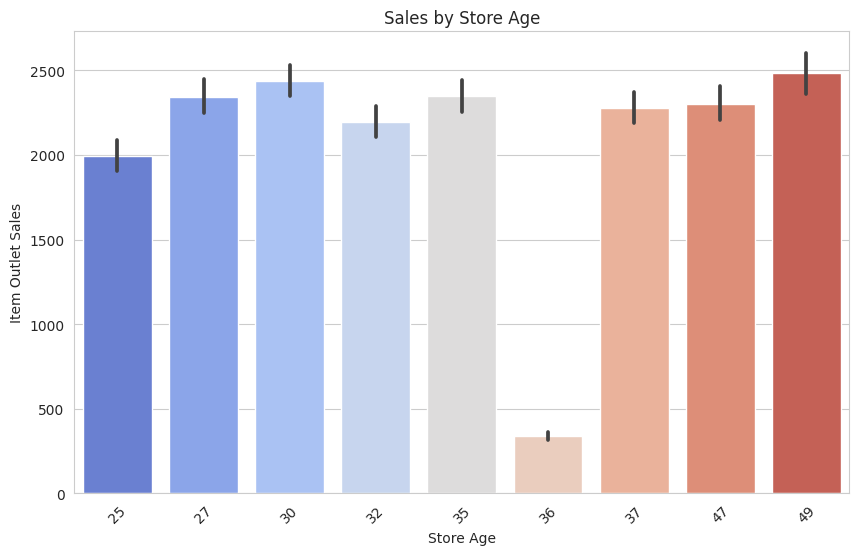

In [49]:
df1['Store_Age'] = 2034 - df1['Outlet_Establishment_Year']
df2['Store_Age'] = 2034 - df2['Outlet_Establishment_Year']

# 3. Sales by Store Age
plt.figure(figsize=(10, 6))
sns.barplot(x='Store_Age', y='Item_Outlet_Sales', data=df1, palette='coolwarm')
plt.title('Sales by Store Age')
plt.ylabel('Item Outlet Sales')
plt.xlabel('Store Age')
plt.xticks(rotation=45)
plt.show()

In [ ]:
plt.figure(figsize=(10, 6))
sns.barplot(x='Store_Age', y='Outlet_Type', data=df1, palette='coolwarm')
plt.title('Sales by Store Age')
plt.ylabel('Item Outlet Sales')
plt.xlabel('Store Age')
plt.xticks(rotation=45)
plt.show()

In [ ]:
# 5. Sales by Outlet Type
plt.figure(figsize=(8, 6))
sns.boxplot(x='Outlet_Type', y='Item_Outlet_Sales', data=df1, palette='icefire')
plt.title('Sales by Outlet Type')
plt.ylabel('Item Outlet Sales')
plt.xlabel('Outlet Type')
plt.xticks(rotation=45)
plt.show()


In [ ]:
# 2. Sales by Visibility
plt.figure(figsize=(20, 6))
sns.scatterplot(x='Item_Type', y='Item_Visibility', data=df1, color='blue', alpha=0.6)
plt.title('Item by Visibility')
plt.ylabel('Item Visibility')
plt.xlabel('Item Type')
plt.show()

In [ ]:
plt.figure(figsize=(10, 6))
sns.lmplot(x='Item_Visibility', y='Item_Outlet_Sales', hue='Item_Type', data=df1, palette='coolwarm', aspect=2, height=6)
plt.title('Visibility of Item and Its Sales with Trend Lines')
plt.ylabel('Item Outlet Sales')
plt.xlabel('Item Visibility')
plt.show()




In [ ]:
# 4. Sales by Item Type
plt.figure(figsize=(12, 8))
sns.barplot(x='Item_Type', y='Item_Outlet_Sales', data=df1, palette='magma')
plt.title('Sales by Item Type')
plt.ylabel('Item Outlet Sales')
plt.xlabel('Item Type')
plt.xticks(rotation=90)
plt.show()

In [ ]:
g = sns.FacetGrid(df1, col='Outlet_Type', hue='Item_Fat_Content', col_wrap=2, height=4, palette='coolwarm')
g = g.map(plt.scatter, 'Item_Visibility', 'Item_Outlet_Sales', edgecolor="w").add_legend()
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Visibility vs. Sales by Outlet Type and Fat Content')
plt.show()


In [ ]:
g = sns.FacetGrid(df1, col="Outlet_Type", col_wrap=2, height=4, margin_titles=True)
g.map_dataframe(sns.scatterplot, x="Item_Type", y="Item_Visibility", hue="Item_Fat_Content")
g.set_axis_labels("Item Type", "Item Visibility")
g.set_titles(col_template="{col_name}")
g.add_legend()
plt.xticks(rotation=45)
plt.show()


In [ ]:
# Highest selling item type for each store type
highest_sales_per_store = df1.loc[df1.groupby('Outlet_Type')['Item_Outlet_Sales'].idxmax()]

# Lowest selling item type for each store type
lowest_sales_per_store = df1.loc[df1.groupby('Outlet_Type')['Item_Outlet_Sales'].idxmin()]

# Highest visibility item type for each store type
highest_visibility_per_store = df1.loc[df1.groupby('Outlet_Type')['Item_Visibility'].idxmax()]

# Lowest visibility item type for each store type
lowest_visibility_per_store = df1.loc[df1.groupby('Outlet_Type')['Item_Visibility'].idxmin()]

# Displaying the results
print("Highest Selling Item Type for Each Store Type:")
print(highest_sales_per_store[['Outlet_Type', 'Item_Type', 'Item_Outlet_Sales']], '\n')

print("Lowest Selling Item Type for Each Store Type:")
print(lowest_sales_per_store[['Outlet_Type', 'Item_Type', 'Item_Outlet_Sales']], '\n')

print("Highest Visibility Item Type for Each Store Type:")
print(highest_visibility_per_store[['Outlet_Type', 'Item_Type', 'Item_Visibility']], '\n')

print("Lowest Visibility Item Type for Each Store Type:")
print(lowest_visibility_per_store[['Outlet_Type', 'Item_Type', 'Item_Visibility']])


In [ ]:
# Descriptive Statistics for Item_Outlet_Sales
sales_desc = df1['Item_Outlet_Sales'].describe()
print(sales_desc)

In [ ]:
# Select only numerical columns for correlation analysis
numerical_df = df1.select_dtypes(include=['float64', 'int64'])
correlation_matrix = numerical_df.corr()
print(correlation_matrix['Item_Outlet_Sales'])

In [ ]:
# Distribution Analysis of Item_Outlet_Sales
sns.histplot(df1['Item_Outlet_Sales'], kde=True)

# Interpretation:
# - A symmetric distribution suggests balanced sales.
# - Skewness indicates bias towards lower or higher sales.
# - KDE curve helps understand the shape of distribution.

In [ ]:
sns.boxplot(x=df1['Item_Outlet_Sales'])

# Interpretation:
# - Points beyond the whiskers in the boxplot indicate outliers.
# - Identifying outliers is crucial for understanding sales extremes and data quality.


In [ ]:
# Grouped Analysis by Outlet_Type
grouped_sales_outlet_type = df1.groupby('Outlet_Type')['Item_Outlet_Sales'].mean()
print(grouped_sales_outlet_type)

# Interpretation:
# This analysis provides average sales figures for each type of outlet, helping identify which outlet type performs best.

In [ ]:
# Assuming you have two types of outlets: 'Grocery Store' and 'Supermarket Type1'
group1 = df1[df1['Outlet_Type'] == 'Grocery Store']['Item_Outlet_Sales']
group2 = df1[df1['Outlet_Type'] == 'Supermarket Type1']['Item_Outlet_Sales']

# Perform T-Test
t_stat, p_val = ttest_ind(group1, group2, equal_var=False)
print(f"T-Statistic: {t_stat}, P-value: {p_val}")

# Interpretation:
# - A low p-value (typically < 0.05) indicates strong evidence against the null hypothesis, so you reject the null hypothesis.
# - A high p-value (> 0.05) suggests weak evidence against the null hypothesis, so you fail to reject the null hypothesis.

In [ ]:
# Dynamically generating groups for ANOVA
outlet_types = df1['Outlet_Type'].unique()  # Extracts all unique outlet types from your DataFrame
groups = [df1[df1['Outlet_Type'] == outlet]['Item_Outlet_Sales'] for outlet in outlet_types]

# Perform ANOVA
f_stat, p_val = f_oneway(*groups)
print(f"F-Statistic: {f_stat}, P-value: {p_val}")

# Interpretation:
# - An F-Statistic value indicates the ratio of variance between the groups to the variance within the groups.
# - A low p-value (<0.05) suggests that there are significant differences in the average sales across different outlet types,
#   meaning at least one outlet type's average sales differ significantly from the others.

In [ ]:
# Creating a contingency table of the frequencies of Outlet_Location_Type and Outlet_Size
contingency_table = pd.crosstab(df1['Outlet_Location_Type'], df1['Outlet_Size'])

# Performing the Chi-Square Test
chi2, p_value, dof, expected = chi2_contingency(contingency_table)

print(f"Chi-Squared Value: {chi2}")
print(f"P-Value: {p_value}")
print(f"Degrees of Freedom: {dof}")
print("Expected Frequencies:")
print(expected)

# Interpretation
if p_value < 0.05:
    print("There is a significant association between Outlet Location Type and Outlet Size.")
else:
    print("There is no significant association between Outlet Location Type and Outlet Size.")


''' Explanation:
Chi-Squared Value: This is the test statistic. A higher value indicates a greater discrepancy between observed and expected frequencies under the null hypothesis of independence.
P-Value: This indicates the probability of observing the data if the null hypothesis is true. A low p-value (typically < 0.05) suggests rejecting the null hypothesis, implying a significant association between the variables.
Degrees of Freedom: This is calculated based on the number of levels in each categorical variable. It's used in determining the critical value from the chi-square distribution.
Expected Frequencies: These are the frequencies expected in each category combination if there were no association between the variables.'''

In [ ]:
# Initialize label encoder
label_encoder = LabelEncoder()

# Fit on the training data and transform both training and test data
df1['Outlet_Type_Encoded'] = label_encoder.fit_transform(df1['Outlet_Type'])
df2['Outlet_Type_Encoded'] = label_encoder.transform(df2['Outlet_Type'])

In [ ]:
# Calculate the mean visibility per item
visibility_avg = df1[df1['Item_Visibility'] > 0].groupby('Item_Identifier')['Item_Visibility'].mean()

# Function to adjust item visibility
def adjust_visibility(row):
    if row['Item_Visibility'] == 0:
        return visibility_avg[row['Item_Identifier']]
    return row['Item_Visibility']

# Apply function to both training and test sets
df1['Adjusted_Item_Visibility'] = df1.apply(adjust_visibility, axis=1)
df2['Adjusted_Item_Visibility'] = df2.apply(adjust_visibility, axis=1)

In [ ]:
# calculating age for the test set
current_year = 2024

df2['Outlet_Age'] = current_year - df2['Outlet_Establishment_Year']

In [ ]:
# Print unique values in Item_Visibility
unique_item_visibility = df1['Item_Visibility'].unique()
print("Unique Item Visibility values:")
print(unique_item_visibility)

# Print unique values in Item_MRP
unique_item_mrp = df1['Item_MRP'].unique()
print("\nUnique Item MRP values:")
print(unique_item_mrp)

In [38]:
# Binning for Item_Visibility
visibility_bins = [0, 0.05, 0.1, 0.15, np.inf]
visibility_labels = ['Low', 'Medium', 'High', 'Very High']
df1['Item_Visibility_Bin'] = pd.cut(df1['Item_Visibility'], bins=visibility_bins, labels=visibility_labels, right=False)
df2['Item_Visibility_Bin'] = pd.cut(df2['Item_Visibility'], bins=visibility_bins, labels=visibility_labels, right=False)

# Binning for Item_MRP
mrp_bins = df1['Item_MRP'].quantile([0, 0.25, 0.5, 0.75, 1]).values
mrp_labels = ['Low', 'Medium', 'High', 'Very High']
df1['Item_MRP_Bin'] = pd.cut(df1['Item_MRP'], bins=mrp_bins, labels=mrp_labels)
df2['Item_MRP_Bin'] = pd.cut(df2['Item_MRP'], bins=mrp_bins, labels=mrp_labels)

# Displaying the head of the adjusted DataFrames to verify changes
print("Training Set Adjustments:")
print(df1[['Item_Visibility', 'Item_Visibility_Bin', 'Item_MRP', 'Item_MRP_Bin']].head())

print("\nTest Set Adjustments:")
print(df2[['Item_Visibility', 'Item_Visibility_Bin', 'Item_MRP', 'Item_MRP_Bin']].head())

Training Set Adjustments:
   Item_Visibility Item_Visibility_Bin  Item_MRP Item_MRP_Bin
0         0.016047                 Low  249.8092    Very High
1         0.019278                 Low   48.2692          Low
2         0.016760                 Low  141.6180       Medium
3         0.000000                 Low  182.0950         High
4         0.000000                 Low   53.8614          Low

Test Set Adjustments:
   Item_Visibility Item_Visibility_Bin  Item_MRP Item_MRP_Bin
0         0.007565                 Low  107.8622       Medium
1         0.038428                 Low   87.3198          Low
2         0.099575              Medium  241.7538    Very High
3         0.015388                 Low  155.0340         High
4         0.118599                High  234.2300    Very High


In [45]:
# Initialize label encoder
label_encoder = LabelEncoder()

# List of categorical columns to encode
categorical_cols = ['Item_Fat_Content', 'Outlet_Size', 'Outlet_Location_Type', 'Outlet_Type']

# Encode categorical columns
for col in categorical_cols:
    df1[col] = label_encoder.fit_transform(df1[col])
    df2[col] = label_encoder.transform(df2[col])  # Ensure the same encoding on test data

# Separating the features and target variable
X_train = df1.drop(columns=['Item_Outlet_Sales'])
y_train = df1['Item_Outlet_Sales']

# Assuming df2 does not include the target variable
X_test = df2

In [50]:

# Impute missing values
# Use mean imputation for numeric columns and most frequent for categorical ones
numeric_columns = X_train.select_dtypes(include=['int64', 'float64']).columns
categorical_columns = X_train.select_dtypes(include=['object', 'category']).columns

numeric_imputer = SimpleImputer(strategy='mean')
categorical_imputer = SimpleImputer(strategy='most_frequent')

X_train[numeric_columns] = numeric_imputer.fit_transform(X_train[numeric_columns])
X_train[categorical_columns] = categorical_imputer.fit_transform(X_train[categorical_columns])

# Apply the same transformation to the test set
X_test[numeric_columns] = numeric_imputer.transform(X_test[numeric_columns])
X_test[categorical_columns] = categorical_imputer.transform(X_test[categorical_columns])

In [51]:
models = {
    'Linear Regression': LinearRegression(),
    'Random Forest': RandomForestRegressor(),
    'XGBoost': XGBRegressor(objective='reg:squarederror'),
    'LightGBM': LGBMRegressor()
}

# Function to evaluate models
def evaluate_models(models, X_train, y_train):
    for name, model in models.items():
        model.fit(X_train, y_train)
        scores = cross_val_score(model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
        rmse_scores = np.sqrt(-scores)
        print(f"{name} Average RMSE: {np.mean(rmse_scores)}")

# Evaluate models
evaluate_models(models, X_train, y_train)

ValueError: could not convert string to float: 'FDA15'

ValueError: 
All the 5 fits failed.
It is very likely that your model is misconfigured.
You can try to debug the error by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_base.py", line 656, in fit
    X, y, X_offset, y_offset, X_scale = _preprocess_data(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_base.py", line 230, in _preprocess_data
    X = check_array(X, copy=copy, accept_sparse=["csr", "csc"], dtype=FLOAT_DTYPES)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py", line 879, in check_array
    array = _asarray_with_order(array, order=order, dtype=dtype, xp=xp)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_array_api.py", line 185, in _asarray_with_order
    array = numpy.asarray(array, order=order, dtype=dtype)
ValueError: could not convert string to float: 'FDY38'

--------------------------------------------------------------------------------
4 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_base.py", line 648, in fit
    X, y = self._validate_data(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 584, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py", line 1106, in check_X_y
    X = check_array(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py", line 921, in check_array
    _assert_all_finite(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py", line 111, in _assert_all_finite
    raise ValueError("Input contains NaN")
ValueError: Input contains NaN


In [52]:
print(df1.dtypes)

Item_Identifier                object
Item_Weight                   float64
Item_Fat_Content                int64
Item_Visibility               float64
Item_Type                      object
Item_MRP                      float64
Outlet_Identifier              object
Outlet_Establishment_Year       int64
Outlet_Size                     int64
Outlet_Location_Type            int64
Outlet_Type                     int64
Item_Outlet_Sales             float64
Store_Age                       int64
Outlet_Type_Encoded             int64
Adjusted_Item_Visibility      float64
Item_Visibility_Bin          category
Item_MRP_Bin                 category
dtype: object
